### 🚀 Optimize Görüntü İşleme Başlangıcı

* **Klasör:** `el_yazisi_fotograflari`

* **Bulunan Resim Sayısı:** 10 (Ödev için en az 10 olmalıdır.)


### 🖼️ Görüntü 1: foto7.jpg

> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi

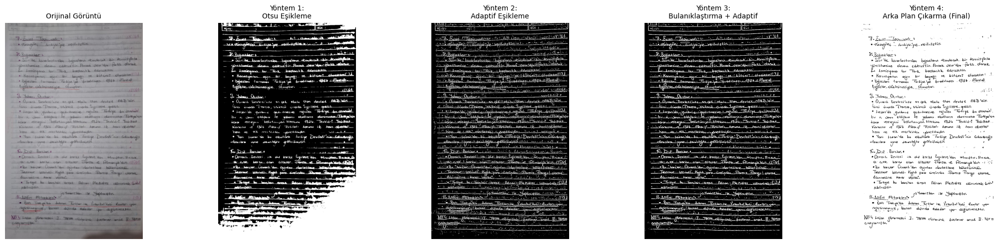


### 🖼️ Görüntü 2: foto8.jpg

> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi

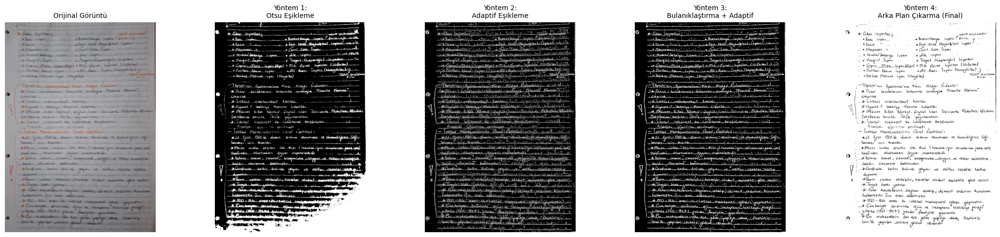


### 🖼️ Görüntü 3: foto2.jpg

> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi

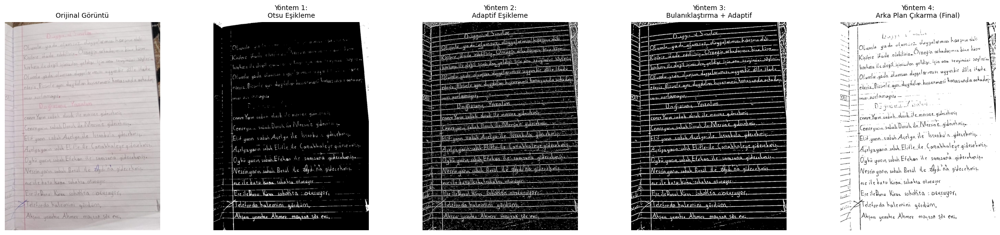


### 🖼️ Görüntü 4: foto6.jpg

> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi

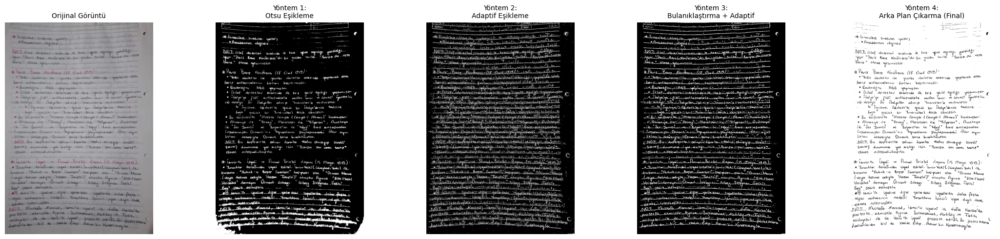


### 🖼️ Görüntü 5: foto5.jpg

> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi

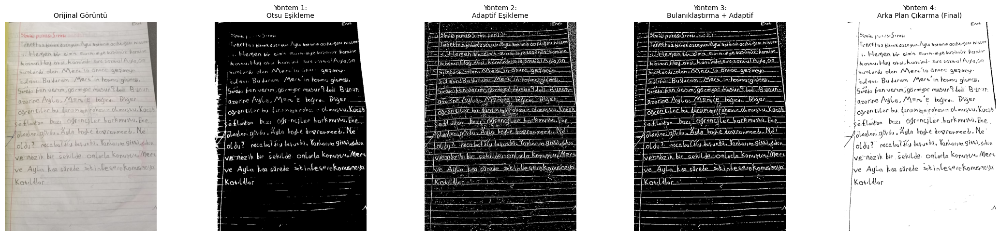


### 🖼️ Görüntü 6: foto1.jpg

> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi

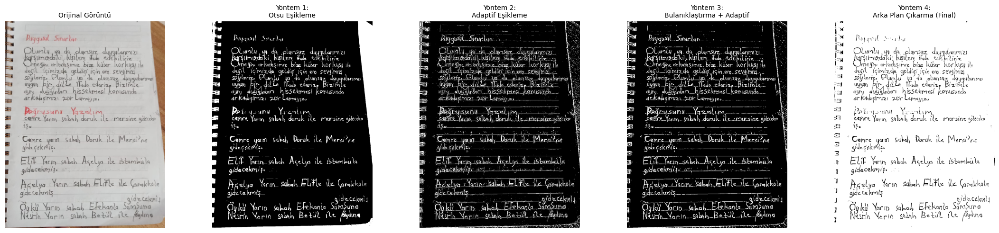


### 🖼️ Görüntü 7: foto3.jpg

> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi

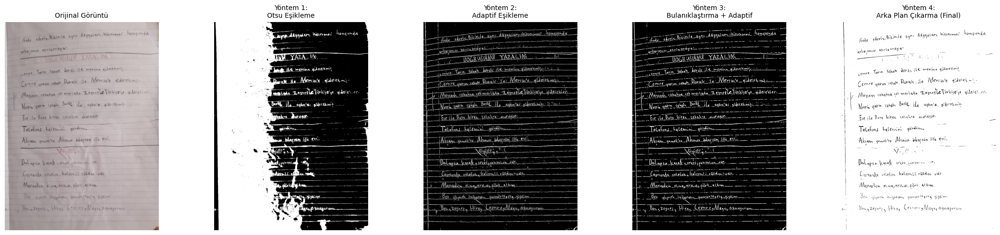


### 🖼️ Görüntü 8: foto4.jpg

> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi

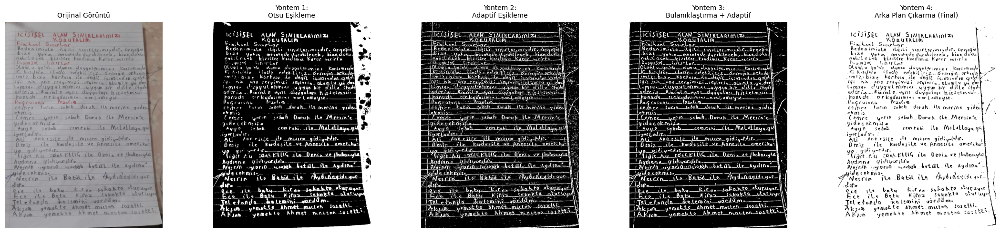


### 🖼️ Görüntü 9: foto.jpg

> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi

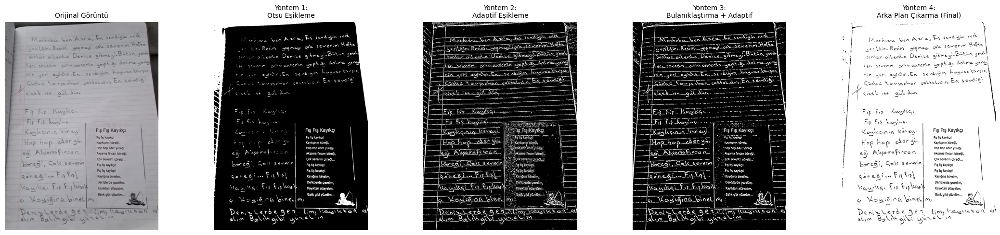


### 🖼️ Görüntü 10: foto9.jpg

> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi

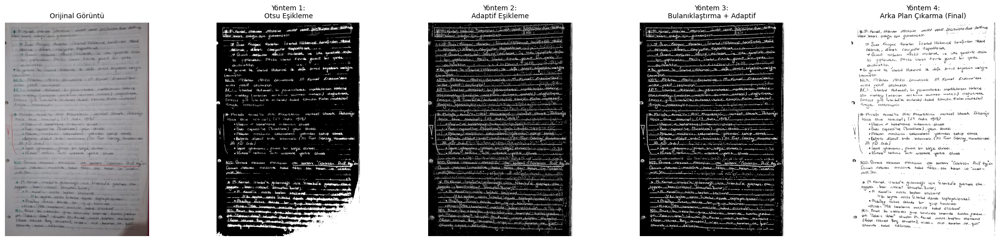

### ✅ Tüm İşlemler Tamamlandı.

Kod çıktıları yukarıda gösterilmiştir. **Yöntem 4 (Final)**, en net ve okunabilir siyah-beyaz çıktıyı (beyaz arka plan, siyah yazı ile) vermelidir.

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython.display import display, Markdown

# --- 0. TANIMLAMALAR VE HAZIRLIK ---
# Görüntülerin bulunduğu klasör yolu
image_folder = "el_yazisi_fotograflari"
# Ödev gereği en az 10 görüntü kullanılmalıdır.
MIN_IMAGE_COUNT = 10

# Eğer klasör yoksa oluştur
if not os.path.exists(image_folder):
    os.makedirs(image_folder)

# Klasördeki tüm resim dosyalarını alalım
image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

display(Markdown(f"###  Optimize Görüntü İşleme Başlangıcı"))
display(Markdown(f"* **Klasör:** `{image_folder}`"))
display(Markdown(f"* **Bulunan Resim Sayısı:** {len(image_files)} (Ödev için en az {MIN_IMAGE_COUNT} olmalıdır.)"))

if not image_files:
    display(Markdown(f"** HATA:** Klasörde resim bulunamadı. Lütfen resimleri buraya yerleştirin."))

# --- 1. GÖRÜNTÜ İŞLEME VE KARŞILAŞTIRMALI ÇIKTILAR ---

for i, img_file in enumerate(image_files):
    if i >= MIN_IMAGE_COUNT:
        break

    current_image_path = os.path.join(image_folder, img_file)
    original_image = cv2.imread(current_image_path)

    if original_image is None:
        print(f"Hata: {current_image_path} yüklenemedi.")
        continue

    # Görüntüleri hazırlama
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

    results = {} # Tüm yöntem çıktılarını saklamak için sözlük

    # --- YÖNTEM 1: Basit Global Eşikleme (Otsu) ---
    # Not: Otsu ile beyaz arka plan için THRESH_BINARY_INV kullanıyoruz.
    _, otsu_thresholded = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    results['Otsu Eşikleme'] = otsu_thresholded

    # --- YÖNTEM 2: Adaptif Eşikleme (Gaussian) ---
    # Not: Adaptif eşikleme genellikle THRESH_BINARY kullanır, sonra ters çevirebiliriz.
    # Burada doğrudan THRESH_BINARY_INV kullanırsak yazı ve arka plan ters olur.
    # En iyi yaklaşım, THRESH_BINARY kullanıp sonra bitwise_not ile ters çevirmektir.
    adaptive_threshold_temp = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                                 cv2.THRESH_BINARY, 11, 2)
    adaptive_thresholded = cv2.bitwise_not(adaptive_threshold_temp) # Ters çevirme
    results['Adaptif Eşikleme'] = adaptive_thresholded

    # --- YÖNTEM 3: Gürültü Azaltma + Adaptif Eşikleme ---
    blurred_image = cv2.medianBlur(gray_image, 5) # Gürültü azaltma
    combined_threshold_temp = cv2.adaptiveThreshold(blurred_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                                 cv2.THRESH_BINARY, 11, 2)
    combined_thresholded = cv2.bitwise_not(combined_threshold_temp) # Ters çevirme
    results['Bulanıklaştırma + Adaptif'] = combined_thresholded

    # --- YÖNTEM 4: FİNAL OPTİMİZASYON - RADİKAL ARKA PLAN ÇIKARMA ---
    # Yüksek parlama ve çizgili arka plan sorunlarına nihai çözüm.

    # 0. Adım: Arka Plan Tahmini (Çok Yüksek Bulanıklık)
    kernel_size = (35, 35)
    background_estimate = cv2.GaussianBlur(gray_image, kernel_size, 0)

    # 1. Adım: Arka Planı Çıkarma (Gölge Düzeltme)
    subtracted_image = cv2.subtract(background_estimate, gray_image)

    # 2. Adım: Kontrast Normalizasyonu
    normalized_image = cv2.normalize(subtracted_image, None, 0, 255, cv2.NORM_MINMAX)
    normalized_image = cv2.convertScaleAbs(normalized_image)

    # 3. Adım: Çizgi Temizleme (Daha önce çıkarılan arka plan üzerinde)
    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40, 1))
    detected_lines = cv2.morphologyEx(normalized_image, cv2.MORPH_OPEN, horizontal_kernel, iterations=1)
    cleaned_of_lines = cv2.subtract(normalized_image, detected_lines)

    # 4. Adım: Final Hassas Eşikleme (Otsu) - Buradaki ana değişiklik!
    # Beyaz arka plan, siyah yazı için THRESH_BINARY_INV kullanıyoruz.
    _, final_optimized_image = cv2.threshold(cleaned_of_lines, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    results['Arka Plan Çıkarma (Final)'] = final_optimized_image

    # --- KARŞILAŞTIRMALI GÖRSELLEŞTİRME ---

    display(Markdown(f"\n###  Görüntü {i+1}: {img_file}"))
    display(Markdown(f"> **Görüntü Kaynağı:** Kendi Koleksiyonunuz / OpenCV Kütüphanesi"))

    fig, axes = plt.subplots(1, 5, figsize=(22, 5))

    axes[0].imshow(original_image_rgb)
    axes[0].set_title("Orijinal Görüntü", fontsize=10)
    axes[0].axis('off')

    method_names = list(results.keys())
    for j in range(len(method_names)):
        axes[j+1].imshow(results[method_names[j]], cmap='gray')
        axes[j+1].set_title(f"Yöntem {j+1}:\n{method_names[j]}", fontsize=10)
        axes[j+1].axis('off')

    plt.tight_layout()
    plt.show()

# --- SONUÇ ---
display(Markdown("###  Tüm İşlemler Tamamlandı."))
display(Markdown("Kod çıktıları yukarıda gösterilmiştir. **Yöntem 4 (Final)**, en net ve okunabilir siyah-beyaz çıktıyı (beyaz arka plan, siyah yazı ile) vermelidir."))

In [ ]:
from google.colab import drive
drive.mount('/content/drive')